# Подготовка данных для подачи на обучение искуственной нейронной сети

In [108]:
import cv2
import matplotlib.pyplot as plt

In [3]:
path='trash/12/'

In [4]:
filename='23-11-2021_02-19-15_PM.txt'

# Отрисовка границ выявленных областей с мусором

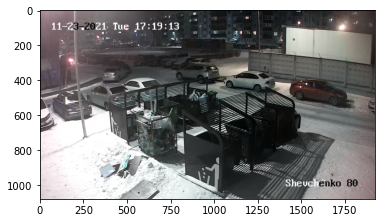

In [140]:
img = cv2.imread(path+filename[:-4]+'.png')
plt.imshow(img)

In [6]:
path+filename

'trash/12/23-11-2021_02-19-15_PM.txt'

In [61]:
info=[]
with open(path+filename) as file:
    info=file.read()
print(info)

0 0.3634088541666667 0.5487777777777777 0.10741145833333335 0.16266666666666668
0 0.53015625 0.7782870370370369 0.14248958333333336 0.2788703703703703
0 0.6880000000000001 0.6142870370370371 0.12740624999999994 0.2118703703703704
0 0.42923177083333336 0.5243472222222223 0.089328125 0.1613796296296297
1 0.5145833333333333 0.47709259259259257 0.03290625000000003 0.11059259259259259
0 0.6201484374999999 0.6894074074074074 0.14373437500000003 0.254425925925926
1 0.348171875 0.6491851851851852 0.1268645833333333 0.2599814814814815



In [12]:
import numpy as np

In [130]:
info=np.loadtxt(path+filename) #гораздо лучше!

In [14]:
info #'bool','centerX','centerY','width','height'

array([[0.        , 0.36340885, 0.54877778, 0.10741146, 0.16266667],
       [0.        , 0.53015625, 0.77828704, 0.14248958, 0.27887037],
       [0.        , 0.688     , 0.61428704, 0.12740625, 0.21187037],
       [0.        , 0.42923177, 0.52434722, 0.08932812, 0.16137963],
       [1.        , 0.51458333, 0.47709259, 0.03290625, 0.11059259],
       [0.        , 0.62014844, 0.68940741, 0.14373438, 0.25442593],
       [1.        , 0.34817188, 0.64918519, 0.12686458, 0.25998148]])

In [36]:
info.shape

(7, 5)

In [15]:
img.shape

(1080, 1920, 3)

In [20]:
img.shape[1]*info[4][1],img.shape[0]*info[4][2]

(987.9999999999999, 515.26)

In [17]:
info[4]

array([1.        , 0.51458333, 0.47709259, 0.03290625, 0.11059259])

# Выделим контейнеры требующие вывоза:

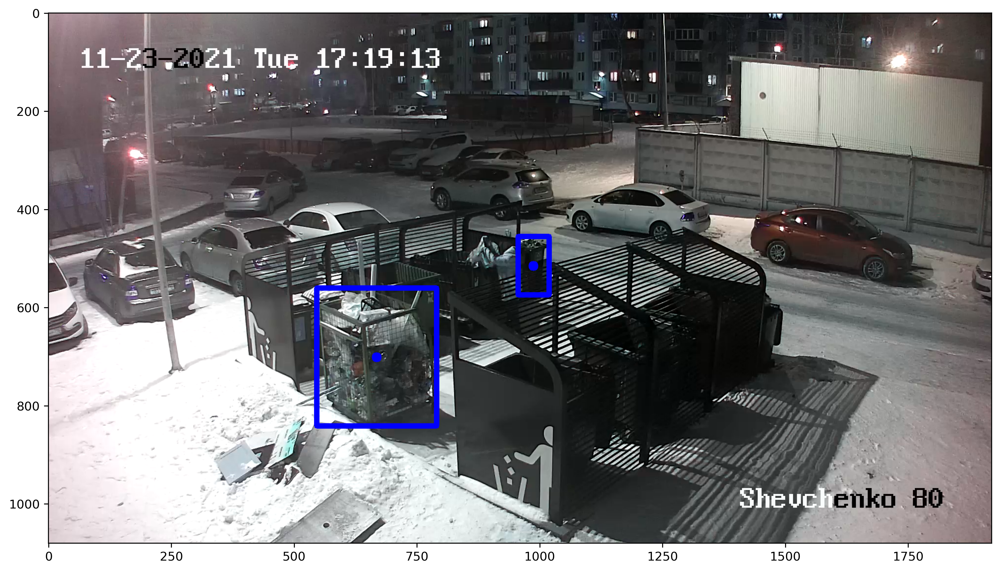

In [141]:
img_=cv2.circle(img, 
                ((img.shape[1]*info[4][1]).astype(int),(img.shape[0]*info[4][2]).astype(int)), 
                radius=10, 
                color=(0, 0, 255)
                ,thickness=-1
               )
img_=cv2.circle(img, 
                ((img.shape[1]*info[6][1]).astype(int),(img.shape[0]*info[6][2]).astype(int)), 
                radius=10, 
                color=(0, 0, 255)
                ,thickness=-1
               )
img_=cv2.rectangle(img, 
                   ((img.shape[1]*info[6][1]-(info[6][3]*img.shape[1]/2)).astype(int),(img.shape[0]*info[6][2]-info[6][4]*img.shape[0]/2).astype(int)),
                   ((img.shape[1]*info[6][1]+(info[6][3]*img.shape[1]/2)).astype(int),(img.shape[0]*info[6][2]+info[6][4]*img.shape[0]/2).astype(int)),
                   color=(0, 0, 255),
                  thickness=10
               )
img_=cv2.rectangle(img, 
                   ((img.shape[1]*info[4][1]-(info[4][3]*img.shape[1]/2)).astype(int),(img.shape[0]*info[4][2]-info[4][4]*img.shape[0]/2).astype(int)),
                   ((img.shape[1]*info[4][1]+(info[4][3]*img.shape[1]/2)).astype(int),(img.shape[0]*info[4][2]+info[4][4]*img.shape[0]/2).astype(int)),
                   color=(0, 0, 255),
                  thickness=10
               )
plt.figure(dpi=300,figsize=(16, 8))
plt.imshow(img_)

In [142]:
def draw_areas(imag,info):
    amount=info.shape[0]-1
    
    for i in range(amount):
        # cv2.rectangle(image, start_point, end_point, color, thickness)
        
        imgg=cv2.rectangle(img, 
                           ((img.shape[1]*info[i][1]-(info[i][3]*img.shape[1])/2).astype(int),(img.shape[0]*info[i][2]-info[i][4]*img.shape[0]/2).astype(int)),
                           ((img.shape[1]*info[i][1]+(info[i][3]*img.shape[1])/2).astype(int),(img.shape[0]*info[i][2]+info[i][4]*img.shape[0]/2).astype(int)),
                           color=(0, 0, 255),
                           thickness=10
                          )
        
    return imgg;

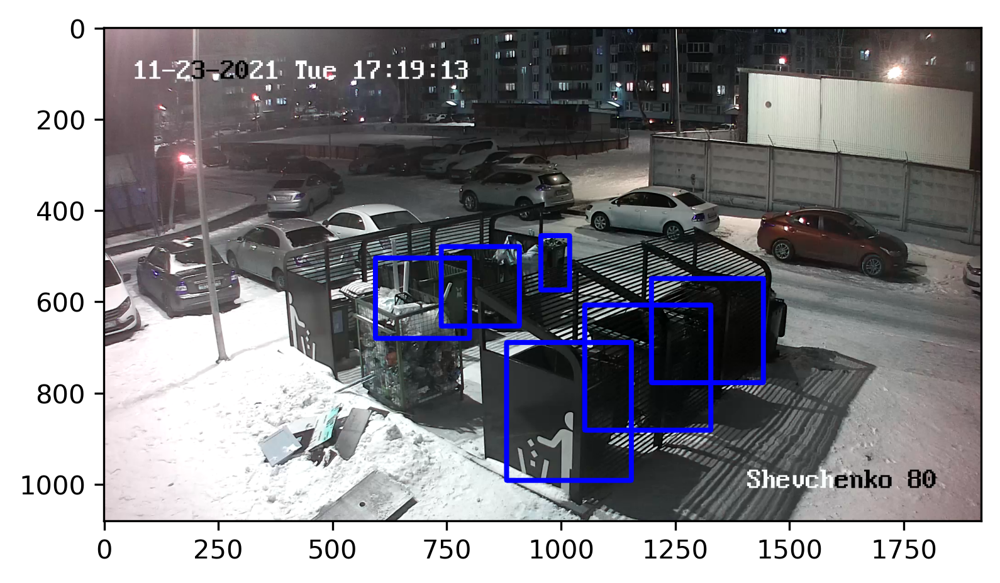

In [131]:
plt.figure(dpi=300)
plt.imshow(draw_areas(img,info))

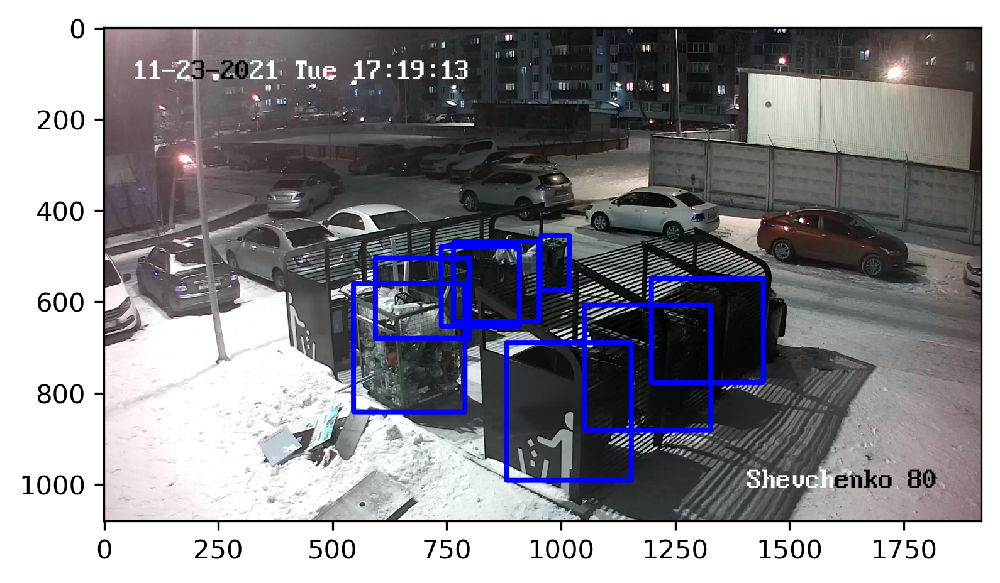

In [132]:
plt.figure(dpi=300)
plt.imshow(draw_areas(cv2.imread(path+'25-11-2021_02-12-38_PM.png'),np.loadtxt(path+'25-11-2021_02-12-38_PM.txt')))

In [49]:
np.loadtxt(path+'25-11-2021_02-12-38_PM.txt')

array([[1.        , 0.44740365, 0.51462963, 0.09779687, 0.16138889],
       [0.        , 0.34817188, 0.64918519, 0.12686458, 0.25998148],
       [0.        , 0.62014844, 0.68940741, 0.14373438, 0.25442593],
       [0.        , 0.53015625, 0.77828704, 0.14248958, 0.27887037],
       [0.        , 0.51458333, 0.47709259, 0.03290625, 0.11059259],
       [0.        , 0.36340885, 0.54877778, 0.10741146, 0.16266667],
       [0.        , 0.68789844, 0.61571296, 0.11300521, 0.20503704]])

In [71]:
len(info)

7

In [99]:
# для внутреннего цикла печатать рои
def get_roi(img,info):
    """Функция возвращающая область из картинки на основе предоставленной разметки"""
    
    x=(img.shape[1]*info[1]-info[3]*img.shape[1]/2).astype(int) # верхняя левая координата по x
    y=(img.shape[0]*info[2]-info[4]*img.shape[0]/2).astype(int) # --//-- по y
    return cv2.putText(img[y:y+(info[4]*img.shape[0]).astype(int),x:x+(info[3]*img.shape[1]).astype(int)], # область интереса
                       str(info[0].astype(int)),# лейбл разметки 1 или 0
                      ((info[4]*img.shape[0]/3).astype(int),(info[3]*img.shape[1]/3).astype(int)),# координаты начала надписи
                      cv2.FONT_HERSHEY_SIMPLEX, # шрифт
                      1, # увеличение шрифтра
                      (100,225,255), # цвет шрифта
                      3,# толщина
                      1)# тип линии


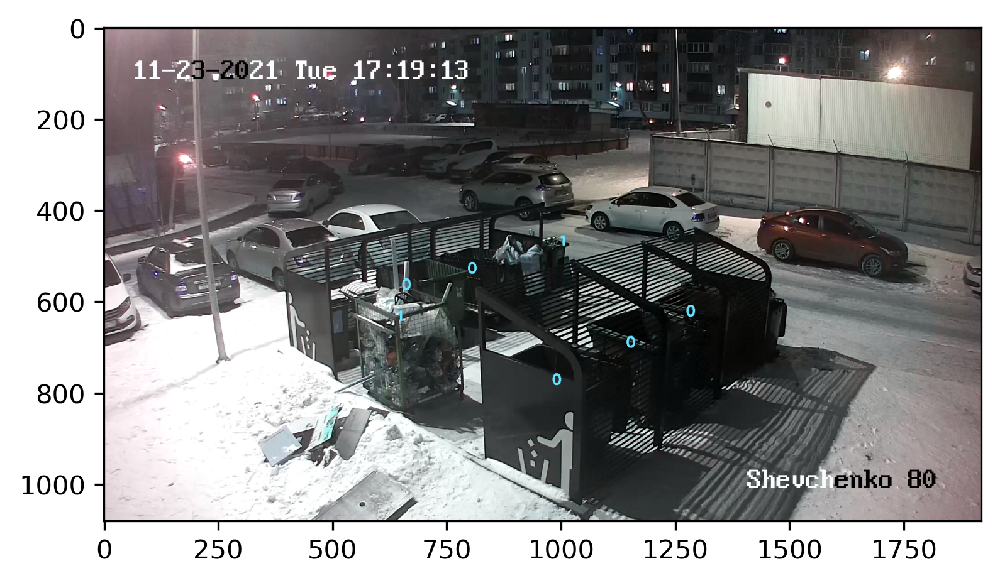

In [137]:
plt.figure(dpi=300)
plt.imshow(img)

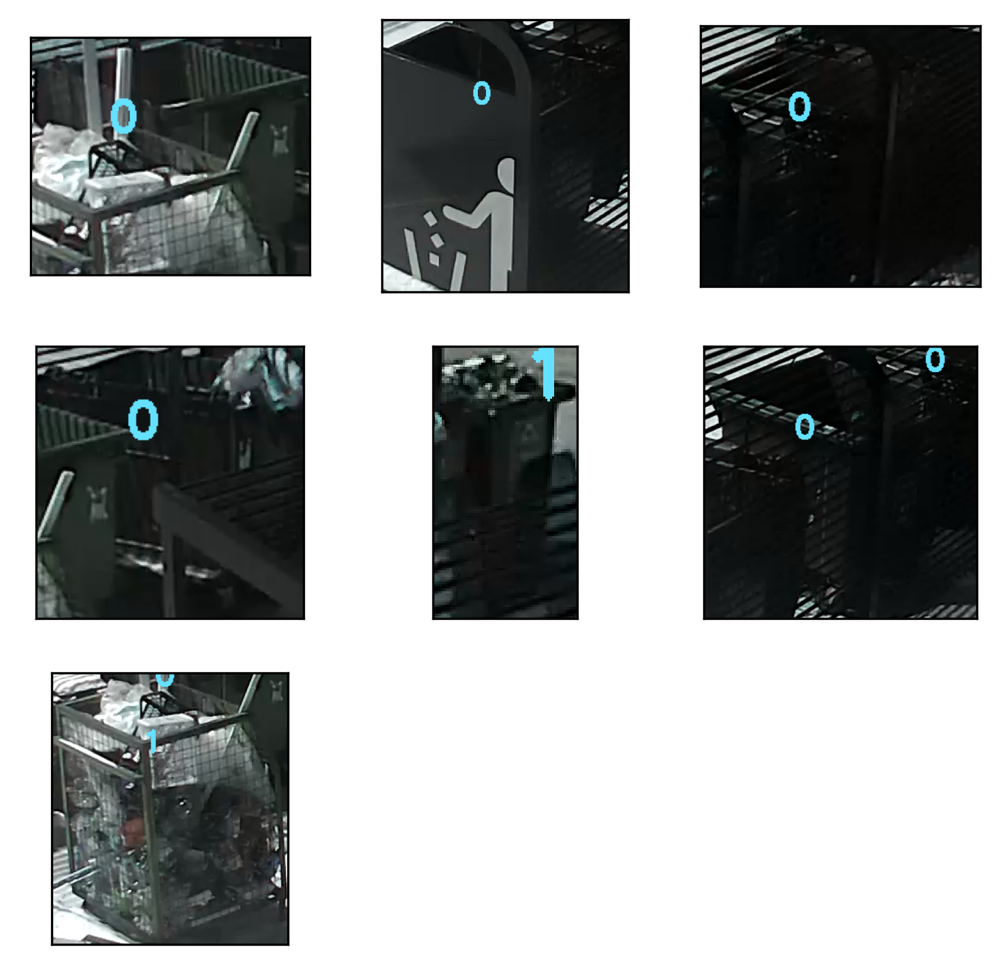

In [136]:
n=len(info)
plt.figure(figsize=(6, 6), dpi=300)
for i in range(n):
    ax = plt.subplot(n % 3 +2 ,n % 3 +2, i + 1)
    plt.imshow(get_roi(img,info[i]))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

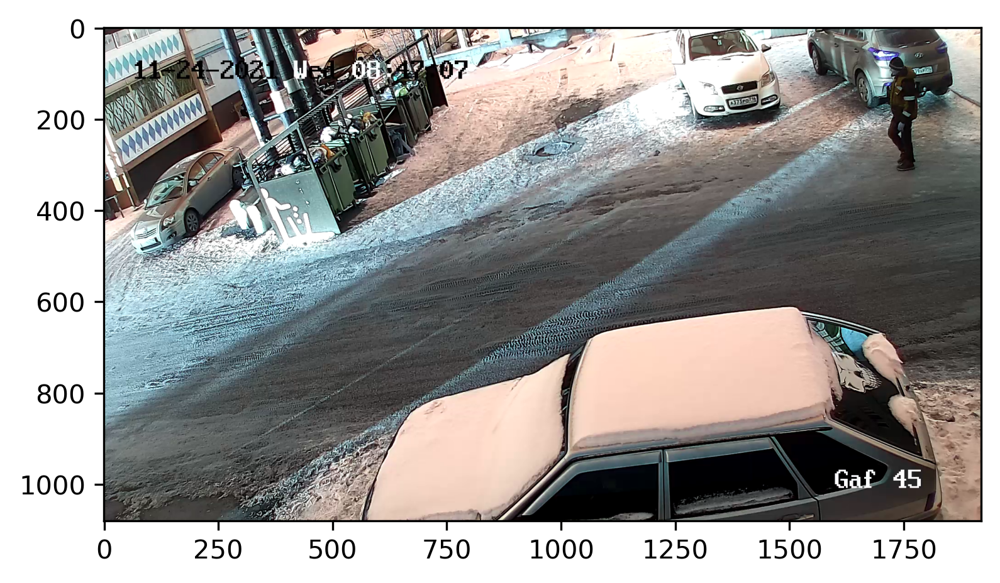

In [138]:
path1='trash/5/'
filename1='24-11-2021_05-47-08_AM'
img = cv2.imread('trash/5/24-11-2021_05-47-08_AM.png')
plt.figure(dpi=300)
plt.imshow(img)

In [113]:
info=np.loadtxt('trash/5/24-11-2021_05-47-08_AM.txt')

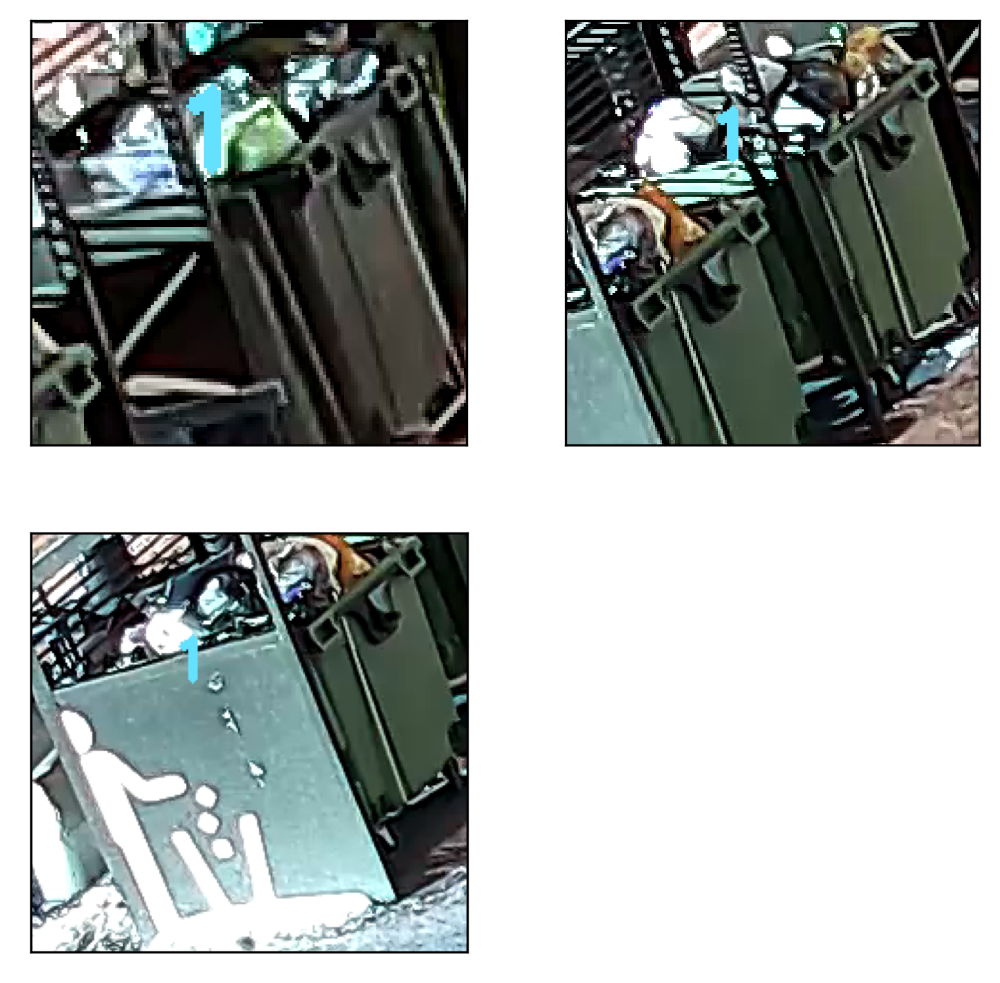

In [116]:
n=len(info)
plt.figure(figsize=(6, 6), dpi=300)
for i in range(n):
    ax = plt.subplot(n % 3 +2 ,n % 3 +2, i + 1)
    plt.imshow(get_roi(img,info[i]))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

# Таким образом, получили возможность подавать на обучение нейронной сети картинки из размеченной выборки.